In [1]:
#%matplotlib inline

import pandas as pd
import numpy as np

import xarray as xr

import regionmask

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import cartopy.feature as cfeat
from mpl_toolkits.axes_grid1 import make_axes_locatable
#import feather, h5py, sys, pickle
from shapely.geometry import Point, Polygon
#from geocube.api.core import make_geocube
import xagg as xa
import netCDF4
import geopandas
import feather 
import cmocean
import scipy
import seaborn as sns

import sys
sys.path.append('../')
import utils
import plotting

import difflib 

np.seterr(invalid='ignore'); # disable a warning from matplotlib and cartopy

In [2]:
#import dataset
df = pd.read_csv('./final_data/df_pm_county_pop.csv', index_col = 0)

In [3]:
df['County_State'] = df['County_State'].str.lower()
df['StateName'] = df['StateName'].str.lower()
df['CountyName'] = df['CountyName'].str.lower()

health data through https://vizhub.healthdata.org/gbd-results/  and state population data through https://www.census.gov/data/tables/time-series/demo/popest/2010s-state-total.html 

In [4]:
#state level population
state_pop = pd.read_excel('../../health_data/nst-est2019-01.xlsx', header = 3)
state_pop = state_pop.rename(columns = {'Unnamed: 0': 'Location'})
state_pop['Location'] = state_pop['Location'].str.replace('.','')
state_pop = state_pop.set_index('Location')
state_pop = state_pop[:58] #cut out the descriptors

/tmp/ipykernel_3424184/2367612385.py:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  state_pop['Location'] = state_pop['Location'].str.replace('.','')


In [5]:
#state level mortality totals
obs_mortality_state = pd.read_excel('../../health_data/gbd_state_mortality_rate_2016_25+.xlsx', header = 0)
obs_mortality_state = pd.merge(obs_mortality_state, state_pop, on ='Location')


In [6]:
#calculate state level mortality rate
obs_mortality_state['rate'] = (obs_mortality_state['Value'])/obs_mortality_state[2016]

In [7]:
obs_mortality_state = obs_mortality_state.rename(columns = {'Location':'StateName'})

In [8]:
obs_mortality_state['StateName'] = obs_mortality_state['StateName'].str.lower()

In [9]:
df = pd.merge(obs_mortality_state[['StateName','rate']], df, on = 'StateName')

Census data through: https://www.census.gov/data/tables/time-series/demo/popest/2010s-counties-detail.html Annual County resident Population Estimates by Age, Sex, Race and Hispanic Origin: April 1, 2010- July 1, 2019 (CC-EST2019-ALLDATA)

In [10]:
census_df = pd.read_csv('final_data/cc-est2019-alldata.csv',engine='python',encoding='latin1')

In [11]:
census_df['CTYNAME'] = census_df['CTYNAME'].str.replace(' Parish', '')
census_df['CTYNAME'] = census_df['CTYNAME'].str.replace(' County', '')
census_df['CTYNAME'] = census_df['CTYNAME'].str.replace(' city', '')

In [12]:
census_df['CTYNAME'] = census_df['CTYNAME'].str.lower()
census_df['STNAME'] = census_df['STNAME'].str.lower()


In [13]:
#select contiguous US only and 2016 population
census_df = census_df[census_df.STNAME.isin(['american samoa', 'alaska','hawaii', 'commonwealth of the northern mariana islands', 'guam', 'puerto rico', 'united states virgin islands']) == False]
census_df = census_df.loc[census_df['YEAR'] == 9] #select for the 2016 population estimate (see https://www2.census.gov/programs-surveys/popest/technical-documentation/file-layouts/2010-2019/cc-est2019-alldata.pdf for detail)
census_df = census_df.loc[census_df['AGEGRP'].isin(range(6,19))] #select for the population over age 25 (see https://www2.census.gov/programs-surveys/popest/technical-documentation/file-layouts/2010-2019/cc-est2019-alldata.pdf for detail)


In [14]:
#fix city names that are different between our two datasets
census_df.loc[(census_df['CTYNAME'] == 'richmond')&(census_df['COUNTY'] == 159), 'CTYNAME'] = 'richmond city' #city
census_df.loc[(census_df['CTYNAME'] == 'richmond')&(census_df['COUNTY'] == 760), 'CTYNAME'] = 'richmond county'


census_df.loc[(census_df['CTYNAME'] == 'baltimore')&(census_df['COUNTY'] == 510), 'CTYNAME'] = 'baltimore city'
census_df.loc[(census_df['CTYNAME'] == 'baltimore')&(census_df['COUNTY'] == 5), 'CTYNAME'] = 'baltimore county'

census_df.loc[(census_df['CTYNAME'] == 'st. louis')&(census_df['COUNTY'] == 510), 'CTYNAME'] = 'st. louis city'
census_df.loc[(census_df['CTYNAME'] == 'st. louis')&(census_df['COUNTY'] == 189), 'CTYNAME'] = 'st. louis county'

In [15]:
#create a county, state column like our pollution dataframe
census_df['County_State'] = census_df['CTYNAME'] + ', ' + census_df['STNAME']

In [16]:
#select contiguous us only for our pollution data
poll_df = df[df.StateName.isin(['american samoa', 'alaska','hawaii', 'commonwealth of the northern mariana islands', 'guam', 'puerto rico', 'united states virgin islands']) == False]


In [17]:
#find dif between two lists (should be none)
for cs in list(set(census_df['County_State']).difference(poll_df['County_State'])):
    print(cs, poll_df.loc[poll_df['County_State'] == cs]['County_State'].values)
    


In [18]:
#find dif between two lists (should be none)
for cs in list(set(poll_df['County_State']).difference(census_df['County_State'])):
    print(cs, census_df.loc[census_df['County_State'] == cs]['County_State'].values)
    


In [19]:
combined_df = census_df.groupby('County_State').sum().merge(poll_df.groupby('County_State').mean(), left_index = True, right_index=True)
combined_df = combined_df.drop(columns = {'AGEGRP','STATE','COUNTY','YEAR','SUMLEV','COUNTYNS'})

In [20]:
combined_df['geometry'] = geopandas.GeoSeries.from_wkt(poll_df.groupby('County_State').first()['geometry_county'])

In [21]:
#create geo dataframe
geo_df = geopandas.GeoDataFrame(combined_df, geometry='geometry')
combined_df = geo_df.copy()

In [22]:
#combine male and female counts
combined_df['American Indian or Alaska Native'] = combined_df['IA_MALE']+combined_df['IA_FEMALE']
combined_df['White'] = combined_df['WA_MALE']+combined_df['WA_FEMALE']
combined_df['Black or African American'] = combined_df['BA_MALE']+combined_df['BA_FEMALE']
combined_df['Asian or Pacific Islander'] = combined_df['NA_MALE']+combined_df['NA_FEMALE'] + combined_df['AA_MALE']+combined_df['AA_FEMALE'] 
combined_df['Hispanic or Latino'] = combined_df['H_MALE']+combined_df['H_FEMALE']

## Beta calculations for PM and Ozone

RR from Di et al. 
ΔM≃β_LL×I_OBS×(Δχ×p_aff )   

In [23]:
delta_chi = 10 #ugm-3
RR_pm = {'low':1.071 , 'mean':1.073, 'high': 1.075} 
RR_o3 = {'low':1.01 , 'mean':1.02, 'high': 1.04} #
β_o3 = {}
β_pm = {}
for ids in ['low','mean','high']:
    β_o3[ids]= np.log(RR_o3[ids])/delta_chi
    β_pm[ids]= np.log(RR_pm[ids])/delta_chi

In [24]:
for sub in ['mean', 'low', 'high']:
    for run in ['nonuc','nonuc_coal','renew_nonuc']:
        combined_df[f'Δmortality_PM_{sub}_{run}'] =  combined_df[f'PM25_{run}']* combined_df['TOT_POP'] * (combined_df['rate'] * β_pm[sub]).values
        combined_df[f'Δmortality_O3_{sub}_{run}'] =  combined_df[f'O3_{run}']* combined_df['TOT_POP'] * (combined_df['rate'] * β_o3[sub]).values
        


In [25]:
for sub in ['mean', 'low', 'high']:
    for run in ['nonuc','nonuc_coal','renew_nonuc']:
        combined_df[f'Δmortality_PM_{sub}_{run}_per1mil'] = combined_df[f'Δmortality_PM_{sub}_{run}']/combined_df[f'TOT_POP']*1e6
        combined_df[f'Δmortality_O3_{sub}_{run}_per1mil'] = combined_df[f'Δmortality_O3_{sub}_{run}']/combined_df[f'TOT_POP']*1e6

# Average Exposure by Race and Ethnicity

Although we have more data specificity in the census, we'll just be looking at what we can compare to the WONDER data

In [26]:
for poll in ['PM25_nonuc','PM25_nonuc_coal','O3_nonuc','O3_nonuc_coal', 'PM25_renew_nonuc', 'O3_renew_nonuc']:
    print('\n', poll, '\n')
    for re in ['Black or African American', 'Asian or Pacific Islander',
        'Hispanic or Latino',
        'White','American Indian or Alaska Native']:
        
        print(re, utils.grouped_weighted_avg(combined_df[poll], combined_df[re]))


 PM25_nonuc 

Black or African American 0.2004409494743178
Asian or Pacific Islander 0.12073943966152245
Hispanic or Latino 0.09718723133849472
White 0.1730767850064544
American Indian or Alaska Native 0.1085920278495084

 PM25_nonuc_coal 

Black or African American 0.2659609067432086
Asian or Pacific Islander 0.1415733814936133
Hispanic or Latino 0.08086993855528171
White 0.18497612048970763
American Indian or Alaska Native 0.12863644659987347

 O3_nonuc 

Black or African American 0.6005544150286577
Asian or Pacific Islander 0.3020898400352239
Hispanic or Latino 0.2438217886359837
White 0.47970989800955516
American Indian or Alaska Native 0.31500799485596165

 O3_nonuc_coal 

Black or African American 1.8120687656357757
Asian or Pacific Islander 0.7548348938313375
Hispanic or Latino 0.5746791984739344
White 1.0894141746307797
American Indian or Alaska Native 0.9046736917508078

 PM25_renew_nonuc 

Black or African American 0.06128769632530111
Asian or Pacific Islander 0.029240369963

## Mortality by Race and Ethnicity

In [27]:
for run in ['nonuc', 'nonuc_coal', 'renew_nonuc']:
    for poll in ['PM','O3']:
        print('\n', run, '\n', poll, '\n')
        for re in ['Black or African American', 'Asian or Pacific Islander',
            'Hispanic or Latino',
            'White','American Indian or Alaska Native']:

            print(re, np.round((((combined_df[f'Δmortality_{poll}_mean_{run}']*combined_df[re]/combined_df['TOT_POP']).sum()/combined_df[re].sum())*1e6),2),
                 '(', np.round((((combined_df[f'Δmortality_{poll}_low_{run}']*combined_df[re]/combined_df['TOT_POP']).sum()/combined_df[re].sum())*1e6),2),',',
                 np.round((((combined_df[f'Δmortality_{poll}_high_{run}']*combined_df[re]/combined_df['TOT_POP']).sum()/combined_df[re].sum())*1e6),2),')')
            #print(re, ((combined_df[f'Δmortality_mean_{poll}_nonuc']/combined_df[re])*1e6).mean())



 nonuc 
 PM 

Black or African American 12.48 ( 12.15 , 12.81 )
Asian or Pacific Islander 7.18 ( 6.99 , 7.37 )
Hispanic or Latino 5.69 ( 5.54 , 5.84 )
White 11.04 ( 10.75 , 11.34 )
American Indian or Alaska Native 6.73 ( 6.55 , 6.91 )

 nonuc 
 O3 

Black or African American 10.57 ( 5.31 , 20.94 )
Asian or Pacific Islander 5.07 ( 2.55 , 10.05 )
Hispanic or Latino 4.01 ( 2.02 , 7.94 )
White 8.69 ( 4.37 , 17.21 )
American Indian or Alaska Native 5.5 ( 2.76 , 10.9 )

 nonuc_coal 
 PM 

Black or African American 16.45 ( 16.01 , 16.88 )
Asian or Pacific Islander 8.5 ( 8.28 , 8.73 )
Hispanic or Latino 5.12 ( 4.99 , 5.26 )
White 11.7 ( 11.39 , 12.01 )
American Indian or Alaska Native 8.0 ( 7.79 , 8.21 )

 nonuc_coal 
 O3 

Black or African American 31.55 ( 15.85 , 62.49 )
Asian or Pacific Islander 12.64 ( 6.35 , 25.03 )
Hispanic or Latino 9.62 ( 4.84 , 19.06 )
White 19.23 ( 9.66 , 38.08 )
American Indian or Alaska Native 15.94 ( 8.01 , 31.58 )

 renew_nonuc 
 PM 

Black or African American 3

## Exposure by Nuclear Containing or not

In [28]:
for run in ['nonuc','nonuc_coal', 'renew_nonuc']:
    print('PM25')
    print('Near', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 1][f'PM25_{run}'],
                  combined_df.loc[combined_df['nuclear_containing'] == 1][f'TOT_POP']))
    print('Not', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 0][f'PM25_{run}'],
                  combined_df.loc[combined_df['nuclear_containing'] == 0][f'TOT_POP']))
    print('O3')
    print('Near', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 1][f'O3_{run}'],
                  combined_df.loc[combined_df['nuclear_containing'] == 1][f'TOT_POP']))
    print('Not', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 0][f'O3_{run}'],
                  combined_df.loc[combined_df['nuclear_containing'] == 0][f'TOT_POP']))

PM25
Near nonuc
0.16183099518456381
Not nonuc
0.17287785352572194
O3
Near nonuc
0.45634273709206774
Not nonuc
0.4827003863729209
PM25
Near nonuc_coal
0.2773825962090709
Not nonuc_coal
0.18625165059536666
O3
Near nonuc_coal
1.4867880622545093
Not nonuc_coal
1.1358113271217445
PM25
Near renew_nonuc
0.05868677523371373
Not renew_nonuc
0.044100204674590096
O3
Near renew_nonuc
-0.19874709615130876
Not renew_nonuc
-0.27089461951868415


## Mortality Difference by Nuclear or Not Containing County

In [29]:
for run in ['nonuc','nonuc_coal', 'renew_nonuc']:
    print('PM25')
    print('Near', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 1][f'Δmortality_PM_mean_{run}_per1mil'], 
                           combined_df.loc[combined_df['nuclear_containing'] == 1][f'TOT_POP']))
    print('Not', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 0][f'Δmortality_PM_mean_{run}_per1mil'], 
                           combined_df.loc[combined_df['nuclear_containing'] == 0][f'TOT_POP']))
    print('O3')
    print('Near', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 1][f'Δmortality_O3_mean_{run}_per1mil'], 
                           combined_df.loc[combined_df['nuclear_containing'] == 1][f'TOT_POP']))
    print('Not', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['nuclear_containing'] == 0][f'Δmortality_O3_mean_{run}_per1mil'], 
                           combined_df.loc[combined_df['nuclear_containing'] == 0][f'TOT_POP']))

PM25
Near nonuc
10.492770029888602
Not nonuc
10.942597673210452
O3
Near nonuc
8.321128976898953
Not nonuc
8.671710938200803
PM25
Near nonuc_coal
17.46029163031294
Not nonuc_coal
11.702133023253905
O3
Near nonuc_coal
26.57408448665092
Not nonuc_coal
19.921377278076204
PM25
Near renew_nonuc
3.8331865180764324
Not renew_nonuc
2.905270534548653
O3
Near renew_nonuc
-3.1998717796657643
Not renew_nonuc
-4.211273692784701


In [34]:
3.8331865180764324/2.905270534548653

1.3193905601882048

In [35]:
-4.211273692784701/-3.1998717796657643



1.3160757626433959

## Exposure by coal containing or not

In [30]:
for run in ['nonuc','nonuc_coal']:
    print('Near', 'PM', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['coal_containing'] == 1][f'PM25_{run}'].groupby('County_State').mean(), 
                     combined_df.loc[combined_df['coal_containing'] == 1][f'TOT_POP'].groupby('County_State').mean()))
    print('Near', 'O3', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['coal_containing'] == 1][f'O3_{run}'].groupby('County_State').mean(), 
                     combined_df.loc[combined_df['coal_containing'] == 1][f'TOT_POP'].groupby('County_State').mean()))
   

Near PM nonuc
0.2138465515695606
Near O3 nonuc
0.5470689119438118
Near PM nonuc_coal
0.18761667516443337
Near O3 nonuc_coal
0.9802142857933591


## Mortality by coal containing or not

In [31]:
for run in ['nonuc','nonuc_coal']:
    print('PM25')
    print('Near', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['coal_containing'] == 1][f'Δmortality_PM_mean_{run}_per1mil'], 
                                    combined_df.loc[combined_df['coal_containing'] == 1][f'TOT_POP']))
    print('Not', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['coal_containing'] == 0][f'Δmortality_PM_mean_{run}_per1mil'], 
                                    combined_df.loc[combined_df['coal_containing'] == 0][f'TOT_POP']))
    print('O3')
    print('Near', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['coal_containing'] == 1][f'Δmortality_O3_mean_{run}_per1mil'], 
                                    combined_df.loc[combined_df['coal_containing'] == 1][f'TOT_POP']))
    print('Not', run)
    print(utils.grouped_weighted_avg(combined_df.loc[combined_df['coal_containing'] == 0][f'Δmortality_O3_mean_{run}_per1mil'], 
                                    combined_df.loc[combined_df['coal_containing'] == 0][f'TOT_POP']))

PM25
Near nonuc
13.711206248059382
Not nonuc
10.21135531757435
O3
Near nonuc
10.050616625601133
Not nonuc
8.298397004296234
PM25
Near nonuc_coal
11.952231618416276
Not nonuc_coal
12.05392802976334
O3
Near nonuc_coal
17.73331077290465
Not nonuc_coal
20.953052724581614


## Histogram Plot of exposure by race and ethnicity

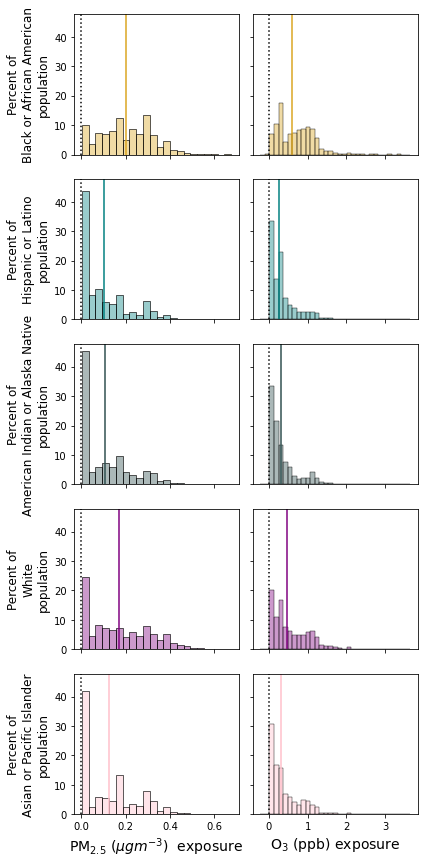

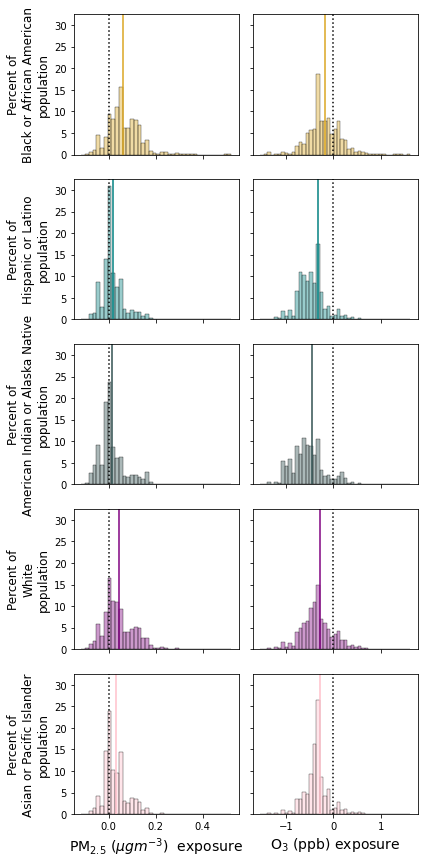

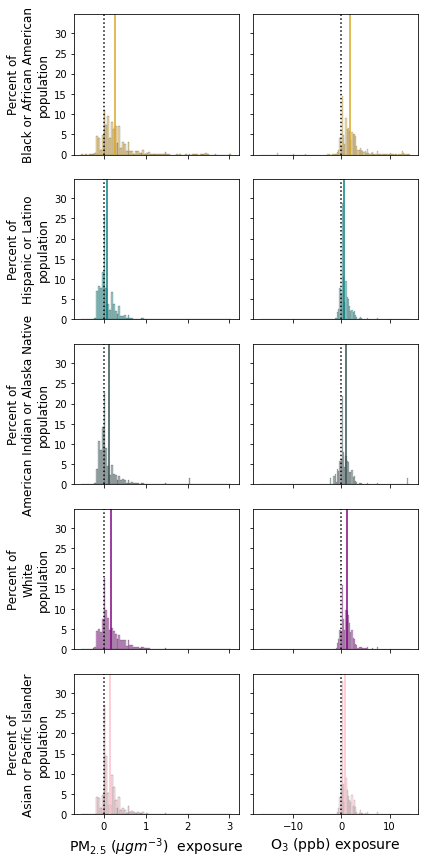

In [34]:
colors = ['goldenrod','teal','darkslategrey','purple','pink']
for run in ['nonuc','renew_nonuc','nonuc_coal']:
    fig, axes = plt.subplots(5,2,sharey = True, figsize = [6,12], sharex = 'col')
    for idx_p, poll in enumerate([f'PM25_{run}', f'O3_{run}' ]):
        q1 = combined_df[poll].quantile(0.25)
        q3 = combined_df[poll].quantile(0.75)
        iqr = q3 - q1
        bin_width = (2 * iqr) / (len(combined_df[poll]) ** (1 / 3))
        bin_count = int(np.ceil((combined_df[poll].max() - combined_df[poll].min()) / bin_width))
        for idx, re in enumerate(['Black or African American',
                'Hispanic or Latino',
                'American Indian or Alaska Native','White','Asian or Pacific Islander']):   
            ax = axes[idx,idx_p]
            axes[idx, 0].set_ylabel(f'Percent of\n{re}\npopulation', fontsize = 12)
            axes[idx,0].set_xlabel(' ')
            axes[idx,1].set_xlabel(' ')
            axes[idx,0].set_xlabel(' ')
            axes[idx,1].set_xlabel(' ')
            axes[4,0].set_xlabel(r'PM$_{2.5}$ ($\mu g m^{-3}$)  exposure', fontsize = 14)
            axes[4,1].set_xlabel(r'O$_3$ (ppb) exposure', fontsize = 14)
            sns.histplot(ax = ax, x = combined_df[poll], weights = combined_df[re]/combined_df[re].sum(), bins = bin_count, alpha = .4, color = colors[idx],  label = re, stat = 'percent')
            ax.axvline(utils.grouped_weighted_avg(combined_df[poll], combined_df[re]), 0,1, color = colors[idx], label = f'{re} Mean ')
            ax.axvline(0, 0,1, color = 'black', linestyle = ':')
           # ax.legend()
    plt.tight_layout()
    plt.savefig(f'Figures/hist_race_ethnicity_exposure_{run}.png', dpi = 350, bbox_inches = 'tight')

## Histogram of mortality by race/ethnicity


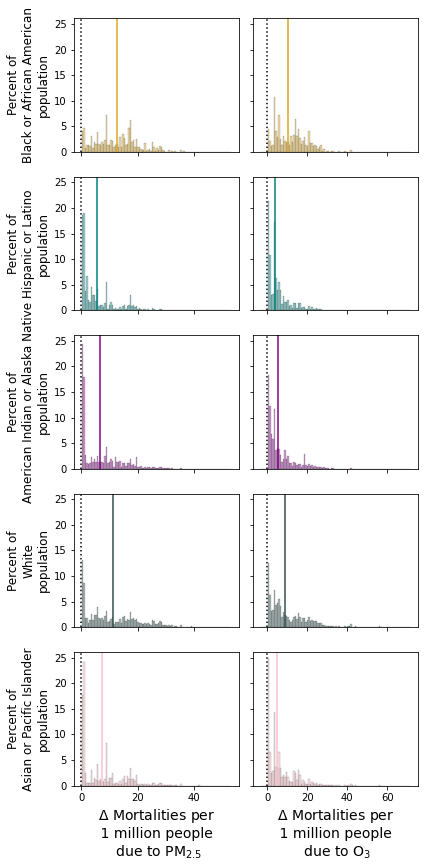

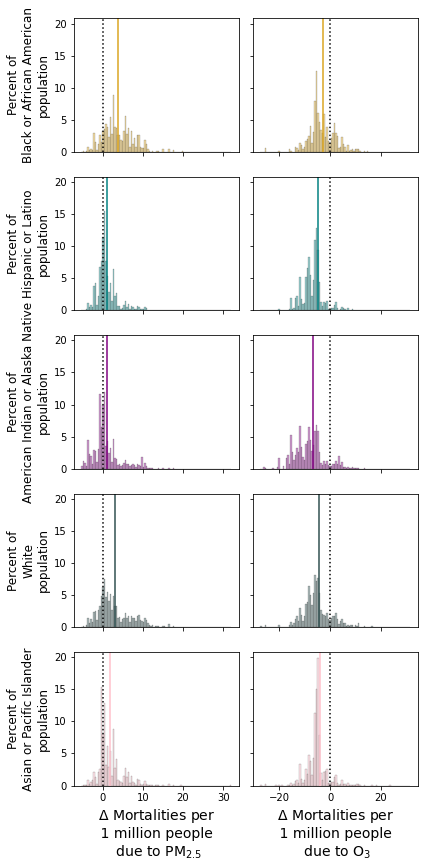

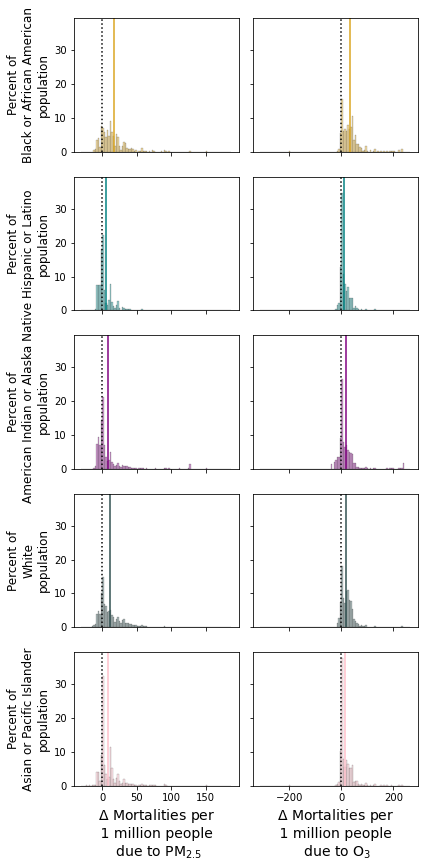

In [80]:
colors = ['goldenrod','teal','purple','darkslategrey','pink']
for run in ['nonuc','renew_nonuc','nonuc_coal']:
    fig, axes = plt.subplots(5,2,sharey = True, figsize = [6,12], sharex = 'col')
    for idx_p, poll in enumerate([f'Δmortality_PM_mean_{run}', f'Δmortality_O3_mean_{run}']):
        q1 = combined_df[poll].quantile(0.25)
        q3 = combined_df[poll].quantile(0.75)
        iqr = q3 - q1
        bin_width = (2 * iqr) / (len(combined_df[poll]) ** (1 / 3))
        bin_count = int(np.ceil((combined_df[poll].max() - combined_df[poll].min()) / bin_width))
        for idx, re in enumerate(['Black or African American',
                'Hispanic or Latino',
                'American Indian or Alaska Native','White','Asian or Pacific Islander']):   
            ax = axes[idx,idx_p]
            axes[idx, 0].set_ylabel(f'Percent of\n{re}\npopulation', fontsize = 12)
            axes[idx,0].set_xlabel(' ')
            axes[idx,1].set_xlabel(' ')
            axes[idx,0].set_xlabel(' ')
            axes[idx,1].set_xlabel(' ')
            axes[4,0].set_xlabel(r'$\Delta$ Mortalities per'+ ' \n 1 million people \n ' + 'due to PM$_{2.5}$', fontsize = 14)
            axes[4,1].set_xlabel(r'$\Delta$ Mortalities per'+ ' \n 1 million people \n ' + 'due to O$_3$', fontsize = 14)
            sns.histplot(ax = ax, x = (combined_df[poll]*combined_df[re]/combined_df['TOT_POP'])/combined_df[re]*1e6, weights = combined_df[re], bins = 100, alpha = .4, color = colors[idx],  label = re, stat = 'percent')
            ax.axvline(np.round((((combined_df[poll]*combined_df[re]/combined_df['TOT_POP']).sum()/combined_df[re].sum())*1e6),2), 
                       0,1, color = colors[idx], label = f'{re} Mean ')
            ax.axvline(0, 0,1, color = 'black', linestyle = ':')
           # ax.legend()
            #ax.set_ylim(0,30)
    plt.tight_layout()
    plt.savefig(f'Figures/hist_race_ethnicity_mortality_{run}.png', dpi = 350, bbox_inches = 'tight')

## Histogram Plot of Mortaliity by coal vs. Nuclear Containing

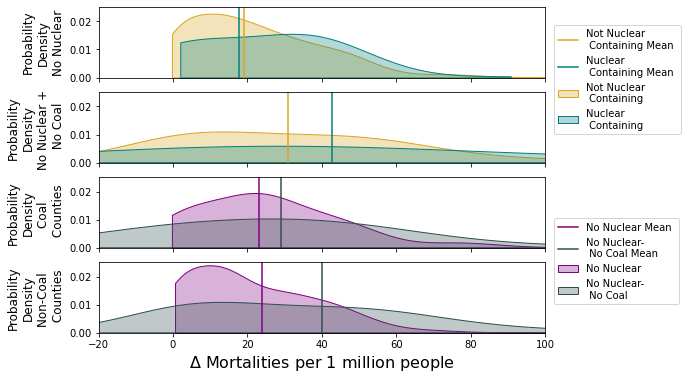

In [36]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, sharex = True, figsize = [8,6], sharey = True)
#ax1 = fig.add_subplot(1,2,1)

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_PM_mean_nonuc_per1mil']) + (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_O3_mean_nonuc_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_PM_mean_nonuc_per1mil']) + (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_O3_mean_nonuc_per1mil'])
colors = ['goldenrod','teal']
label_opt = ['Not Nuclear \n Containing', 'Nuclear \n Containing']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax1, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], cut = 0, label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax1.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax1.set_ylabel('Probability\nDensity\nNo Nuclear', fontsize = 12)
ax1.legend(loc = [1.02,-.8])

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_PM_mean_nonuc_coal_per1mil']) + (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_O3_mean_nonuc_coal_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_PM_mean_nonuc_coal_per1mil']) + (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_O3_mean_nonuc_coal_per1mil'])
label_opt = ['Not Nuclear \n Containing', 'Nuclear \n Containing']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax2, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], cut = 0)
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax2.axvline(x_weighted_avg, 0,1, color = colors[idx])
ax2.set_ylabel('Probability\nDensity\nNo Nuclear + \n No Coal', fontsize = 12)

x1 = (combined_df.loc[combined_df['coal_containing'] == 1]['Δmortality_PM_mean_nonuc_per1mil']) + (combined_df.loc[combined_df['coal_containing'] == 1]['Δmortality_O3_mean_nonuc_per1mil'])
x2 = (combined_df.loc[combined_df['coal_containing'] == 1]['Δmortality_PM_mean_nonuc_coal_per1mil']) + (combined_df.loc[combined_df['coal_containing'] == 1]['Δmortality_O3_mean_nonuc_coal_per1mil'])
label_opt = ['No Nuclear', 'No Nuclear- \n No Coal']

pop = {0:(combined_df.loc[combined_df['coal_containing'] == 1]['TOT_POP']), 1:(combined_df.loc[combined_df['coal_containing'] == 1]['TOT_POP'])}
colors = ['purple','darkslategrey']

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax3, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], cut = 0, label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax3.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax3.set_ylabel('Probability\nDensity\nCoal \n Counties', fontsize = 12)
ax3.legend(loc = [1.02,-.8])

x1 = (combined_df.loc[combined_df['coal_containing'] == 0]['Δmortality_PM_mean_nonuc_per1mil']) + (combined_df.loc[combined_df['coal_containing'] == 0]['Δmortality_O3_mean_nonuc_per1mil'])
x2 = (combined_df.loc[combined_df['coal_containing'] == 0]['Δmortality_PM_mean_nonuc_coal_per1mil']) + (combined_df.loc[combined_df['coal_containing'] == 0]['Δmortality_O3_mean_nonuc_coal_per1mil'])
label_opt = ['No Nuclear', 'No Nuclear-No Coal']

pop = {0:(combined_df.loc[combined_df['coal_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['coal_containing'] == 0]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax4, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], cut = 0)
    ax4.axvline(x.mean(), 0,1, color = colors[idx])
ax4.set_ylabel('Probability\nDensity\nNon-Coal \n Counties', fontsize = 12)
    
plt.xlabel('$\Delta$ Mortalities per 1 million people', fontsize = 16)
plt.xlim(-20,100)
plt.savefig('Figures/systems_analysis_coal_nuc.png', dpi = 300, bbox_inches = 'tight')

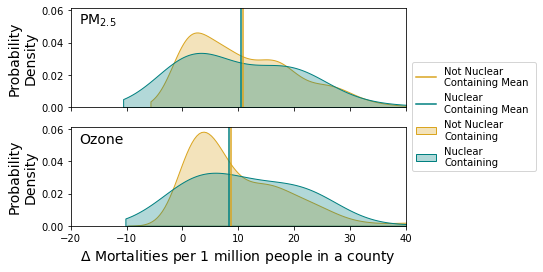

In [33]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = [6,4], sharey = True)
#ax1 = fig.add_subplot(1,2,1)

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_PM_mean_nonuc_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_PM_mean_nonuc_per1mil'])
colors = ['goldenrod','teal']
label_opt = ['Not Nuclear\nContaining', 'Nuclear\nContaining']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    p = sns.kdeplot(x, ax = ax1, weights = pop[idx], shade = True, alpha = .3, color = colors[idx], label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax1.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax1.set_ylabel('Probability\nDensity', fontsize = 14)
ax1.legend(loc = [1.02,-.65])

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_O3_mean_nonuc_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_O3_mean_nonuc_per1mil'])
colors = ['goldenrod','teal']
label_opt = ['Not Nuclear\nContaining', 'Nuclear\nContaining']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax2, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax2.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax2.set_ylabel('Probability\nDensity', fontsize = 14 )

ax1.annotate(r'PM$_{2.5}$', [0,0], xytext=[.025,.84], xycoords="axes fraction", fontsize = 14)
ax2.annotate('Ozone', [0,0], xytext=[.025,.84], xycoords="axes fraction", fontsize = 14)

plt.xlabel(r'$\Delta$ Mortalities per 1 million people in a county', fontsize = 14)

plt.xlim(-20,40)
plt.savefig('Figures/systems_nonuc_poll_mort.png', dpi = 300, bbox_inches = 'tight')

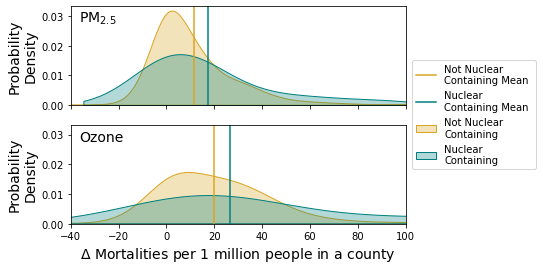

In [34]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = [6,4], sharey = True)
#ax1 = fig.add_subplot(1,2,1)

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_PM_mean_nonuc_coal_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_PM_mean_nonuc_coal_per1mil'])
colors = ['goldenrod','teal']
label_opt = ['Not Nuclear\nContaining', 'Nuclear\nContaining']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    p = sns.kdeplot(x, ax = ax1, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax1.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax1.set_ylabel('Probability\nDensity', fontsize = 14)
ax1.legend(loc = [1.02,-.65])

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_O3_mean_nonuc_coal_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_O3_mean_nonuc_coal_per1mil'])
colors = ['goldenrod','teal']
label_opt = ['Not Nuclear\nContaining', 'Nuclear\nContaining']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax2, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax2.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax2.set_ylabel('Probability\nDensity', fontsize = 14 )

ax1.annotate(r'PM$_{2.5}$', [0,0], xytext=[.025,.84], xycoords="axes fraction", fontsize = 14)
ax2.annotate('Ozone', [0,0], xytext=[.025,.84], xycoords="axes fraction", fontsize = 14)

plt.xlabel(r'$\Delta$ Mortalities per 1 million people in a county', fontsize = 14)

plt.xlim(-40,100)
plt.savefig('Figures/systems_nonuc_coal_poll_mort.png', dpi = 300, bbox_inches = 'tight')

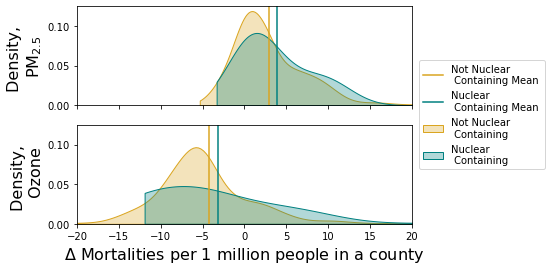

In [35]:
fig, (ax1, ax2) = plt.subplots(2,1, sharex = True, figsize = [6,4], sharey = True)
#ax1 = fig.add_subplot(1,2,1)

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_PM_mean_renew_nonuc_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_PM_mean_renew_nonuc_per1mil'])
colors = ['goldenrod','teal']
label_opt = ['Not Nuclear \n Containing', 'Nuclear \n Containing']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax1, shade = True, weights = pop[idx], alpha = .3, color = colors[idx], cut = 0, label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax1.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax1.set_ylabel('Density, \n'+ r'PM$_{2.5}$', fontsize = 16)
ax1.legend(loc = [1.02,-.65])

x1 = (combined_df.loc[combined_df['nuclear_containing'] == 0]['Δmortality_O3_mean_renew_nonuc_per1mil'])
x2 = (combined_df.loc[combined_df['nuclear_containing'] == 1]['Δmortality_O3_mean_renew_nonuc_per1mil'])
colors = ['goldenrod','teal']
label_opt = ['Not Nuclear \nContaining', 'Nuclear \nContaining']

pop = {0:(combined_df.loc[combined_df['nuclear_containing'] == 0]['TOT_POP']), 1:(combined_df.loc[combined_df['nuclear_containing'] == 1]['TOT_POP'])}

for idx, x in enumerate([x1, x2]):
    sns.kdeplot(x, ax = ax2, shade = True, weights = pop[idx], alpha = .3, cut = 0, color = colors[idx], label = label_opt[idx])
    x_weighted_avg = utils.grouped_weighted_avg(x,pop[idx])
    ax2.axvline(x_weighted_avg, 0,1, color = colors[idx], label = f'{label_opt[idx]} Mean ')
ax2.set_ylabel('Density, \n Ozone', fontsize = 16)

plt.xlabel(r'$\Delta$ Mortalities per 1 million people in a county', fontsize = 16)

plt.xlim(-20,20)
plt.savefig('Figures/systems_nonuc_renew_poll_mort.png', dpi = 300, bbox_inches = 'tight')

## Maps of Different County Exposure by State

In [83]:
counties = geopandas.read_file('data/cb_2018_us_county_500k.shx')
counties = counties.rename(columns = {'NAME':'CountyName'})

states = geopandas.read_file('data/cb_2018_us_state_500k.shx')
states = states.rename(columns = {'NAME':'StateName'})

states['StateName'] = states['StateName'].str.lower()
counties['STATEFP'] = counties['STATEFP'].astype("string")

In [84]:
combined_df['State'] = census_df.groupby('County_State').first()['STNAME']

/tmp/ipykernel_3309409/4294441072.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_3309409/4294441072.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_3309409/4294441072.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


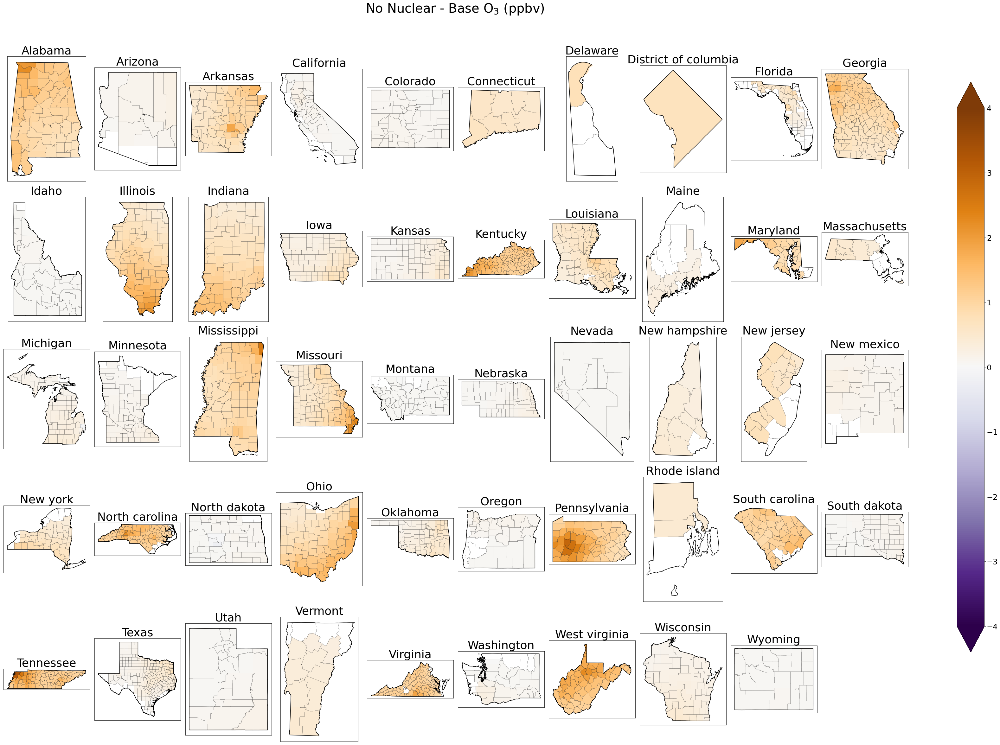

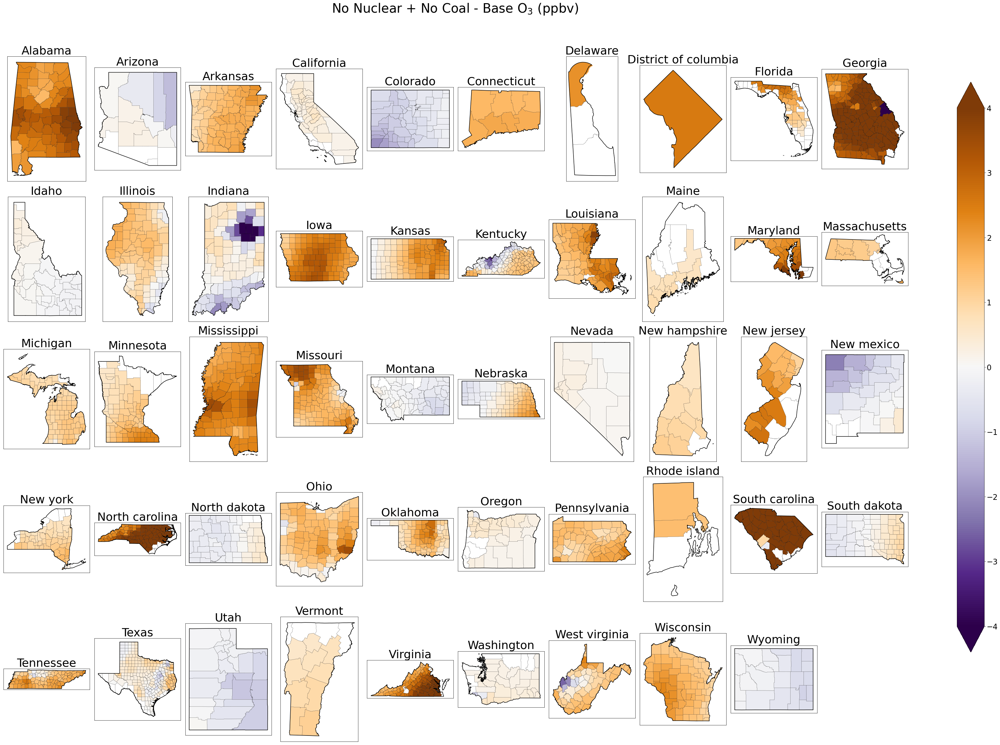

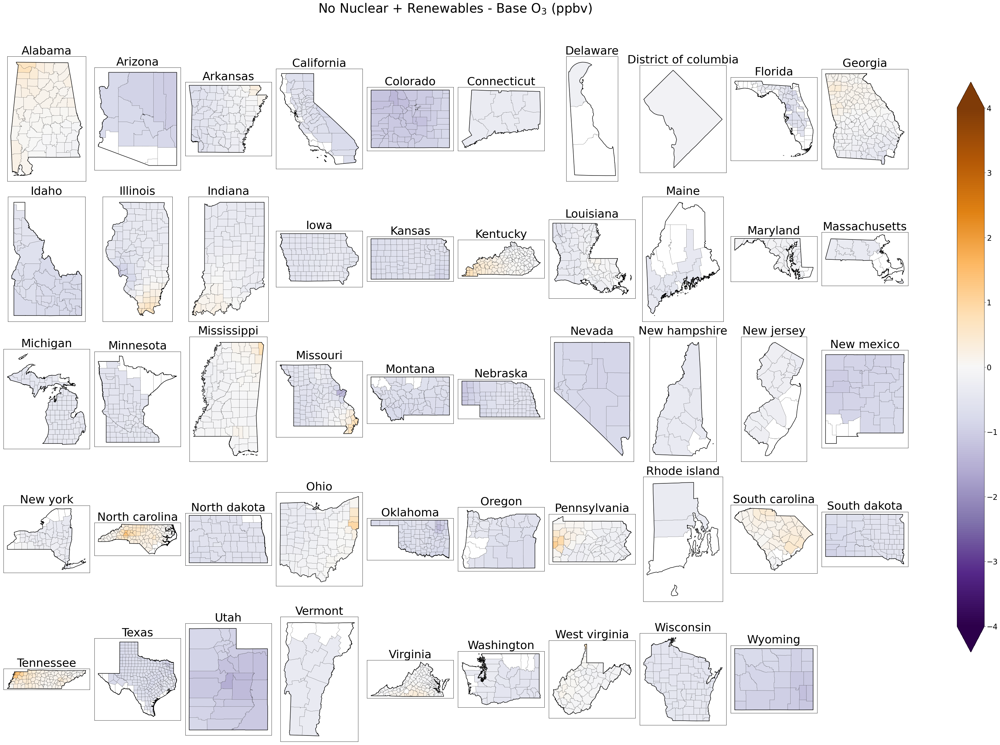

In [85]:
vmin = -4
vmax = 4
cmap = 'PuOr_r'
for idx, run in enumerate(['nonuc','nonuc_coal','renew_nonuc']):
    fig = plt.figure(figsize=[40,50])
    for idx_s, state in enumerate(np.unique(combined_df['State'])):
        ###OZONE###
        ax = fig.add_subplot(8,10,idx_s+1)
        q = combined_df.loc[combined_df['State'] == state].plot(ax = ax, column = f'O3_{run}', legend=False, 
                                                 vmin = vmin, vmax = vmax, 
                                                 cmap = cmap)
        statefp = states.loc[states['StateName'] == state]['STATEFP'].values[0]
        counties.loc[counties['STATEFP'] == statefp].boundary.plot(ax = ax, color = 'k', linewidth = .2)
        states.loc[states['StateName'] == state].boundary.plot(ax = ax, color = 'k',)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(state.capitalize(), fontsize = 36)
    # Add single colorbar
    cax = fig.add_axes([1.05, 0.45, 0.03, 0.5])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax = vmax))
    sm._A = []
    cbar = fig.colorbar(sm, cax=cax, extend = 'both')
    cbar.ax.tick_params(labelsize=24)
    
    if run == 'nonuc':
        plt.suptitle(r'No Nuclear - Base O$_3$ (ppbv)', y = 1.02, fontsize = 40)
    if run == 'nonuc_coal':
        plt.suptitle(r'No Nuclear + No Coal - Base O$_3$ (ppbv)', y = 1.02, fontsize = 40)  
    if run == 'renew_nonuc':
        plt.suptitle(r'No Nuclear + Renewables - Base O$_3$ (ppbv)', y = 1.02, fontsize = 40)  
    plt.tight_layout()
    plt.savefig(f'Figures/{run}_ozone_state_map.png', dpi = 150, bbox_inches = 'tight')


/tmp/ipykernel_3309409/2525557233.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_3309409/2525557233.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_3309409/2525557233.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


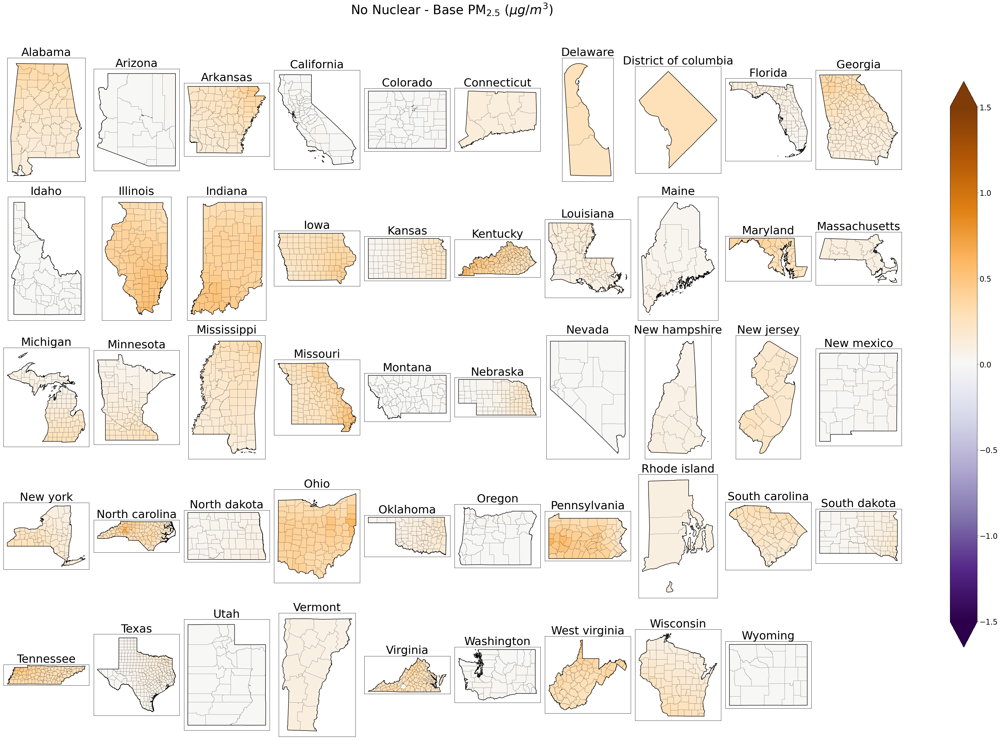

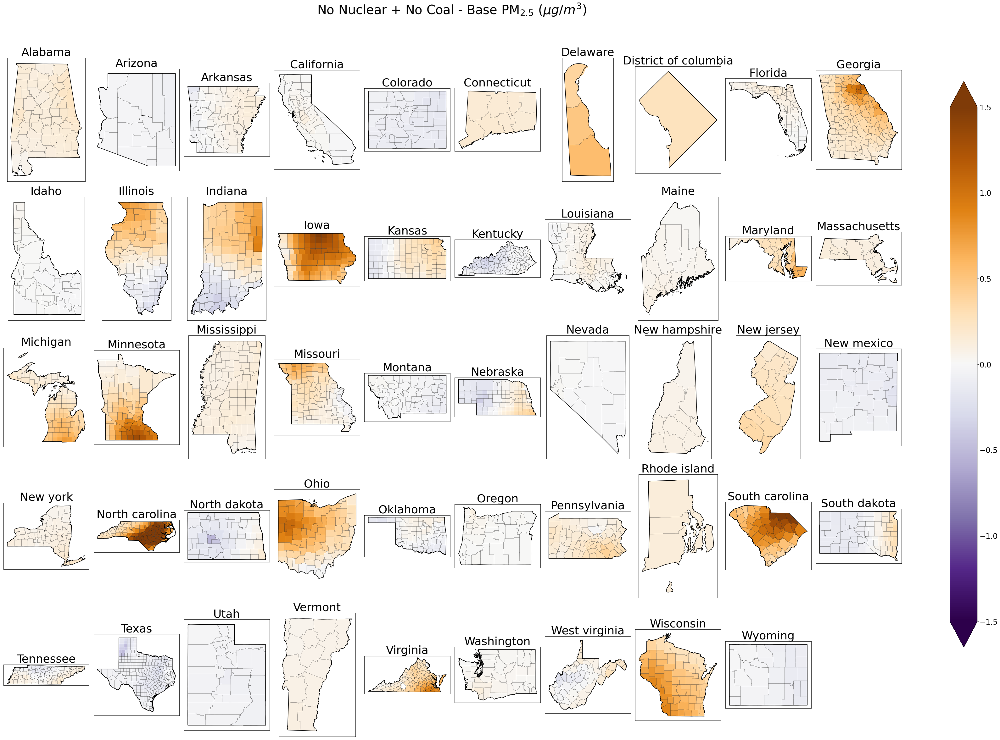

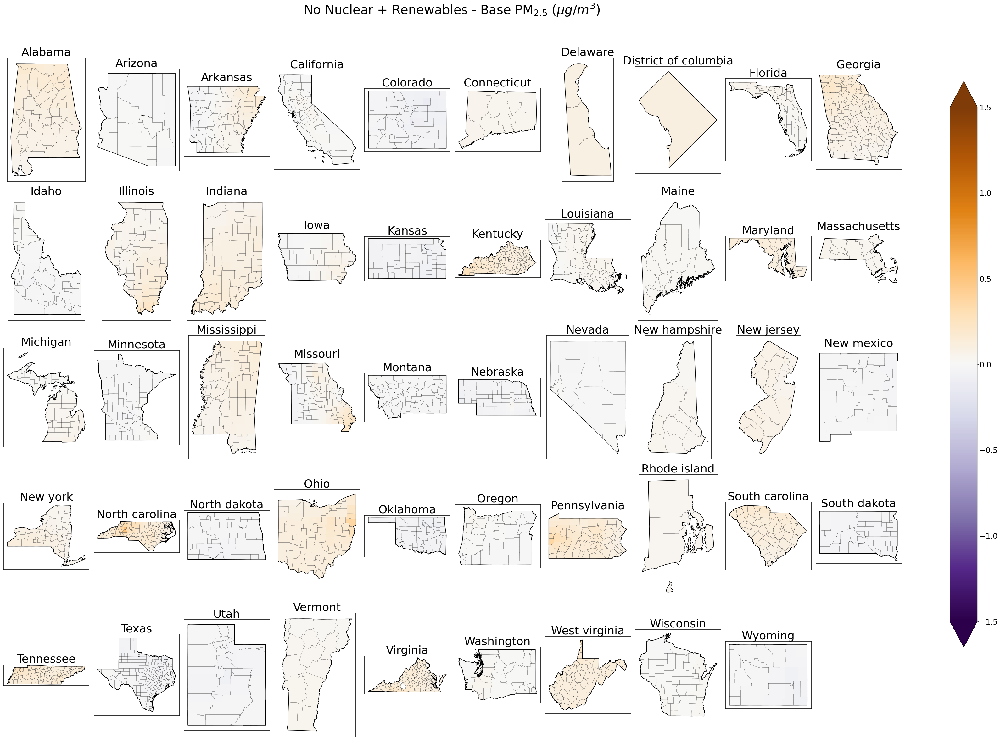

In [86]:
vmin = -1.5
vmax = 1.5
cmap = 'PuOr_r'
for idx, run in enumerate(['nonuc','nonuc_coal','renew_nonuc']):
    fig = plt.figure(figsize=[40,50])
    for idx_s, state in enumerate(np.unique(combined_df['State'])):
        ###PM###
        ax = fig.add_subplot(8,10,idx_s+1)
        q = combined_df.loc[combined_df['State'] == state].plot(ax = ax, column = f'PM25_{run}', legend=False, 
                                                 vmin = vmin, vmax = vmax,  
                                                 cmap = cmap)
        statefp = states.loc[states['StateName'] == state]['STATEFP'].values[0]
        counties.loc[counties['STATEFP'] == statefp].boundary.plot(ax = ax, color = 'k', linewidth = .2)
        states.loc[states['StateName'] == state].boundary.plot(ax = ax, color = 'k',)

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(state.capitalize(), fontsize = 36)
        
    # Add single colorbar
    cax = fig.add_axes([1.05, 0.45, 0.03, 0.5])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax = vmax))
    sm._A = []
    cbar = fig.colorbar(sm, cax=cax, extend = 'both')
    cbar.ax.tick_params(labelsize=24)
    
    if run == 'nonuc':
        plt.suptitle(r'No Nuclear - Base PM$_{2.5}$ ($\mu g/m^3$)', y = 1.02, fontsize = 40)
    if run == 'nonuc_coal':
        plt.suptitle(r'No Nuclear + No Coal - Base PM$_{2.5}$ ($\mu g/m^3$)', y = 1.02, fontsize = 40)  
    if run == 'renew_nonuc':
        plt.suptitle(r'No Nuclear + Renewables - Base PM$_{2.5}$ ($\mu g/m^3$)', y = 1.02, fontsize = 40)  
    plt.tight_layout()
    plt.savefig(f'Figures/{run}_pm_state_map.png', dpi = 150, bbox_inches = 'tight')
